In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal

In [18]:
df = pd.read_csv("./processed/backwarda.csv")
df.head()

,timestamp,Value
0,0.000,8.47
1,0.042,0.03
2,0.043,4.72
3,0.083,-2.00
4,0.123,46.06


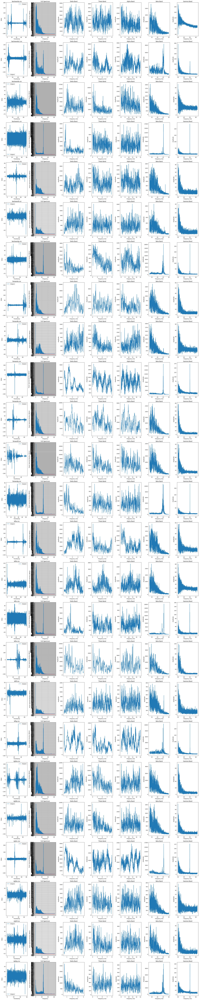

In [94]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Path to the directory containing CSV files
directory = './processed'

# Get list of CSV files in the directory
csv_files = [file for file in os.listdir(directory) if file.endswith('.csv')]

# Define frequency bands
bands = {
    'Delta': (0.5, 4),
    'Theta': (4, 8),
    'Alpha': (8, 13),
    'Beta': (13, 30),
    'Gamma': (30, 100)
}

# Create subplots
num_plots = len(csv_files)
fig, axes = plt.subplots(num_plots, len(bands)+2, figsize=(5*len(bands), 5*num_plots))

# Plot each CSV file and its Fourier transform
for i, file in enumerate(csv_files):
    # Read CSV file
    data = pd.read_csv(os.path.join(directory, file))
    
    # Compute Fourier transform
    y = data['Value']
    N = len(y)
    dt = 1 / 125  # Sampling interval
    freq = np.fft.fftfreq(N, dt)[:N//2]  # Frequencies
    y_fft = np.fft.fft(y)[:N//2]  # Fourier transform
    
    # Plot original data
    axes[i, 0].plot(data['timestamp'], data['Value'], label='Original')
    axes[i, 0].set_title(file)
    axes[i, 0].set_xlabel('TimeStamp')
    axes[i, 0].set_ylabel('Value')
    axes[i, 0].legend()

    # Plot Fourier transform
    axes[i, 1].plot(freq, np.abs(y_fft))
    axes[i, 1].set_title('Full Spectrum')
    axes[i, 1].set_xlabel('Frequency (Hz)')
    axes[i, 1].set_ylabel('Amplitude')

    # Plot Power Spectral Density
    axes[i, 1].psd(y, Fs=125, NFFT=N, color='r', alpha=0.5)

    # Plot filtered bands
    for j, (band_name, (low, high)) in enumerate(bands.items()):
        band_mask = (freq >= low) & (freq <= high)
        band_freq = freq[band_mask]
        band_fft = y_fft[band_mask]
        axes[i, j+2].plot(band_freq, np.abs(band_fft))
        axes[i, j+2].set_title(f'{band_name} Band')
        axes[i, j+2].set_xlabel('Frequency (Hz)')
        axes[i, j+2].set_ylabel('Amplitude')

# Adjust layout
plt.tight_layout()

# Show plot
plt.savefig("see.svg")
plt.show()

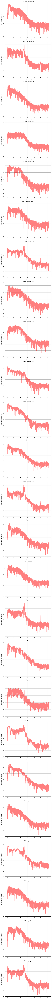

In [95]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Path to the directory containing CSV files
directory = './processed'

# Get list of CSV files in the directory
csv_files = [file for file in os.listdir(directory) if file.endswith('.csv')]

# Create subplots for PSD
num_plots = len(csv_files)
fig, axes = plt.subplots(num_plots, 1, figsize=(8, 6*num_plots))

# Plot each CSV file and its PSD
for i, file in enumerate(csv_files):
    # Read CSV file
    data = pd.read_csv(os.path.join(directory, file))
    
    # Compute PSD
    y = data['Value']
    axes[i].psd(y, Fs=125, NFFT=len(y), color='r', alpha=0.5)
    axes[i].set_title(f'PSD of {file}')
    axes[i].set_xlabel('Frequency (Hz)')
    axes[i].set_ylabel('Power/Frequency (dB/Hz)')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()



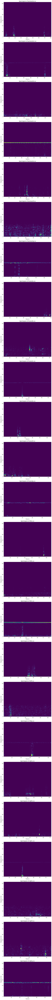

In [96]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Path to the directory containing CSV files
directory = './processed'

# Get list of CSV files in the directory
csv_files = [file for file in os.listdir(directory) if file.endswith('.csv')]

# Create subplots for spectrograms
num_plots = len(csv_files)
fig, axes = plt.subplots(num_plots, 1, figsize=(8, 6*num_plots))

# Plot each CSV file and its spectrogram
for i, file in enumerate(csv_files):
    # Read CSV file
    data = pd.read_csv(os.path.join(directory, file))
    
    # Compute spectrogram
    y = data['Value']
    Fs = 125  # Sampling frequency
    NFFT = 256  # Length of the windowing segments
    noverlap = NFFT // 2  # Overlap between windows
    spec, freqs, times, _ = plt.specgram(y, NFFT=NFFT, Fs=Fs, noverlap=noverlap)
    
    # Plot spectrogram
    axes[i].imshow(spec, aspect='auto', cmap='viridis', origin='lower', extent=[times.min(), times.max(), freqs.min(), freqs.max()])
    axes[i].set_title(f'Spectrogram of {file}')
    axes[i].set_xlabel('Time (s)')
    axes[i].set_ylabel('Frequency (Hz)')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()


In [93]:
import os
import pandas as pd
import numpy as np

# Path to the directory containing CSV files
directory = "./processed"

# Get list of CSV files in the directory
csv_files = [file for file in os.listdir(directory) if file.endswith(".csv")]

# Loop through each CSV file to calculate sampling rate
for file in csv_files:
    # Read CSV file
    data = pd.read_csv(os.path.join(directory, file))

    # Extract timestamps
    timestamps = data["timestamp"]

    # Calculate time difference between consecutive samples
    time_diff = np.diff(timestamps)

    # Calculate the average time difference (sampling period)
    sampling_period = np.mean(time_diff)

    # Calculate the sampling rate (samples per second)
    sampling_rate = 1 / sampling_period

    # Print sampling rate
    print(f"Sampling rate for {file}: {sampling_rate} Hz")

    # Validate the sampling rate (should be close to the expected value)
    expected_sampling_rate = 125  # Expected sampling rate
    if abs(sampling_rate - expected_sampling_rate) < 1:  # Acceptable deviation
        print("Sampling rate validated.")
    else:
        print("Sampling rate validation failed.")

Sampling rate for backwarda.csv: 124.77536548642479 Hz
Sampling rate validated.
Sampling rate for backwarda2.csv: 124.74235536606713 Hz
Sampling rate validated.
Sampling rate for backwardb.csv: 124.75539547942483 Hz
Sampling rate validated.
Sampling rate for backwardc.csv: 124.74248954159978 Hz
Sampling rate validated.
Sampling rate for backwarde.csv: 124.7525918944392 Hz
Sampling rate validated.
Sampling rate for backwardf.csv: 124.76341422130581 Hz
Sampling rate validated.
Sampling rate for backwardg.csv: 124.75818824628111 Hz
Sampling rate validated.
Sampling rate for forwarda.csv: 124.74533340675072 Hz
Sampling rate validated.
Sampling rate for forwardb.csv: 124.75442043222004 Hz
Sampling rate validated.
Sampling rate for forwardc.csv: 124.74978929624947 Hz
Sampling rate validated.
Sampling rate for forwarde.csv: 124.74089428486823 Hz
Sampling rate validated.
Sampling rate for forwardf.csv: 124.7411820262269 Hz
Sampling rate validated.
Sampling rate for forwardg.csv: 124.7489225608

In [67]:
import os
import pandas as pd
import numpy as np
from scipy.signal import welch

# Path to the directory containing CSV files
directory = './processed'

# Get list of CSV files in the directory
csv_files = [file for file in os.listdir(directory) if file.endswith('.csv')]

# Initialize an empty DataFrame to store the results
result_df = pd.DataFrame()

# Loop through each CSV file
for file in csv_files:
    # Read CSV file
    data = pd.read_csv(os.path.join(directory, file))
    
    # Compute FFT
    y = data['Value']
    N = len(y)
    dt = 1 / 125  # Sampling interval
    freq = np.fft.fftfreq(N, dt)[:N//2]  # Frequencies
    y_fft = np.fft.fft(y)[:N//2]  # Fourier transform
    
    # Compute eigenvalues
    fft_real = np.real(y_fft)
    fft_imag = np.imag(y_fft)
    cov_matrix = np.cov(fft_real, fft_imag)
    eigenvalues = np.linalg.eigvals(cov_matrix)
    
    # Compute PSD (Power Spectral Density)
    f, psd = welch(y, fs=125, nperseg=256)  # Adjust parameters as needed
    
    # Compute statistics
    mean_value = np.mean(fft_real)
    max_value = np.max(fft_real)
    std_dev = np.std(fft_real)
    print(len(y_fft))
    print(len(data['timestamp']))
    # Create a DataFrame for this file
    df = pd.DataFrame({
        'timestamp': data['timestamp'],
        'FFT_values': y_fft,
        'Eigenvalues': eigenvalues,
        'PSD_values': psd,
        'Mean': mean_value,
        'Max': max_value,
        'Std_dev': std_dev
    })
    
    # Merge this DataFrame with the result DataFrame
    result_df = pd.concat([result_df, df], ignore_index=True)

# Sort the DataFrame by timestamp
result_df = result_df.sort_values(by='timestamp')

# Display the resulting DataFrame
print(result_df)


4418
8837


ValueError: All arrays must be of the same length

In [71]:
df

,timestamp,Value
0,0.000,8.47
1,0.042,0.03
2,0.043,4.72
3,0.083,-2.00
4,0.123,46.06
...,...,...
8211,83.318,-41.53
8212,83.338,-19.12
8213,83.348,57.59
8214,83.358,86.16


In [97]:
import pandas as pd
import numpy as np
from scipy.fft import fft

def sliding_window_with_timestamp(data, window_size, stride):
    timestamps = data['timestamp'].values
    values = data['Value'].values
    for i in range(0, len(timestamps) - window_size + 1, stride):
        window_timestamps = timestamps[i:i+window_size]
        window_values = values[i:i+window_size]
        yield window_timestamps, window_values

def compute_fft(signal):
    return np.abs(fft(signal))

def compute_statistics(signal):
    mean = np.mean(signal)
    max_val = np.max(signal)
    std_dev = np.std(signal)
    return mean, max_val, std_dev

def process_window(start_timestamp, end_timestamp, window_values):
    fft_result = compute_fft(window_values)
    mean, max_val, std_dev = compute_statistics(window_values)
    
    return start_timestamp, end_timestamp, fft_result, mean, max_val, std_dev

def process_data_with_sliding_window(df, window_size, stride, sampling_rate):
    results = []
    timestamps = df['timestamp'].values
    window_duration = window_size / sampling_rate  # Calculate window duration
    for i, (window_timestamps, window_values) in enumerate(sliding_window_with_timestamp(df, window_size, stride)):
        start_timestamp = window_timestamps[0]
        end_timestamp = window_timestamps[-1]
        result = process_window(start_timestamp, end_timestamp, window_values)
        results.append(result)
    return results, window_duration

# Define parameters
window_size = 100  # adjust according to your preference
stride = 50        # adjust according to your preference
sampling_rate = 125  # Hz

# Process data using sliding window approach
results, window_duration = process_data_with_sliding_window(df, window_size, stride, sampling_rate)

# Print or use results as needed
for result in results:
    start_timestamp, end_timestamp, fft_result, mean, max_val, std_dev = result
    print("Window Timestamps:", start_timestamp, "-", end_timestamp)
    print("Window Duration (seconds):", window_duration)
    print("FFT Result:", fft_result)
    print("Mean:", mean)
    print("Max:", max_val)
    print("Standard Deviation:", std_dev)
    print("\n")


Window Timestamps: 0.0 - 1.357
Window Duration (seconds): 0.8
FFT Result: [ 680.81       1674.90309894 1920.25181934  998.86342368  493.3490193
 1170.97303274  217.92841781 1350.8289349   767.36854421  732.25288841
  912.99456979  283.01768678  322.39612506  259.54587983  424.73185714
  797.8780565   464.17618622  394.39566087  504.29821821  340.31717184
  640.66694295  153.52155914  262.41963044  221.75019071  104.74000049
  132.8124516    98.31922677  152.16208429   35.71659495  114.31147865
  188.33298393  254.70849154  211.08354577  223.97253809  165.053853
  200.81715027   94.35104938  133.09091084  137.8516804   179.35212607
  157.87956141  111.97009784  117.67283923  111.31220957   73.92816865
  102.09058679  133.19555394   82.47235437  243.38105188  199.98373703
  384.57        199.98373703  243.38105188   82.47235437  133.19555394
  102.09058679   73.92816865  111.31220957  117.67283923  111.97009784
  157.87956141  179.35212607  137.8516804   133.09091084   94.35104938
  200.

In [112]:
import pandas as pd
import numpy as np
from scipy.fft import fft

def sliding_window_with_timestamp(data, window_size, stride):
    timestamps = data['timestamp'].values
    values = data['Value'].values
    for i in range(0, len(timestamps) - window_size + 1, stride):
        window_timestamps = timestamps[i:i+window_size]
        window_values = values[i:i+window_size]
        yield window_timestamps, window_values

def compute_fft(signal):
    return np.abs(fft(signal))

def compute_statistics(signal):
    mean = np.mean(signal)
    max_val = np.max(signal)
    std_dev = np.std(signal)
    return mean, max_val, std_dev

def process_window(start_timestamp, end_timestamp, window_values):
    fft_result = compute_fft(window_values)
    mean, max_val, std_dev = compute_statistics(window_values)
    
    return start_timestamp, end_timestamp, fft_result, mean, max_val, std_dev

def adjust_window_parameters(window_duration, sampling_rate):
    window_size = int(window_duration * sampling_rate)  # Convert window duration to samples
    stride = window_size // 2  # Set stride to half the window size for 50% overlap
    return window_size, stride

def process_data_with_sliding_window(df, window_duration, sampling_rate):
    window_size, stride = adjust_window_parameters(window_duration, sampling_rate)
    results = []
    timestamps = df['timestamp'].values
    for i, (window_timestamps, window_values) in enumerate(sliding_window_with_timestamp(df, window_size, stride)):
        start_timestamp = window_timestamps[0]
        end_timestamp = window_timestamps[-1]
        result = process_window(start_timestamp, end_timestamp, window_values)
        results.append(result)
    return results

# Define parameters


C:\Users\PMLS\AppData\Local\Temp\ipykernel_8188\3274323585.py:56: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  result_df[fft_columns] = pd.DataFrame(result_df['FFT Result'].tolist())
C:\Users\PMLS\AppData\Local\Temp\ipykernel_8188\3274323585.py:56: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  result_df[fft_columns] = pd.DataFrame(result_df['FFT Result'].tolist())
C:\Users\PMLS\AppData\Local\Temp\ipykernel_8188\3274323585.py:56: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.in

,Start Timestamp,End Timestamp,Mean,Max,Standard Deviation,FFT_0,FFT_1,FFT_2,FFT_3,FFT_4,...,FFT_115,FFT_116,FFT_117,FFT_118,FFT_119,FFT_120,FFT_121,FFT_122,FFT_123,FFT_124
0,0.000,1.608,-1.35800,137.75,51.790652,169.75,1793.872607,2019.887042,1537.803997,832.249638,...,795.946400,1373.740862,798.745493,496.343727,1171.270169,560.556825,832.249638,1537.803997,2019.887042,1793.872607
1,0.972,2.230,-6.33120,26.53,38.458734,791.40,1944.710611,1427.151758,1042.334176,818.092308,...,414.689713,445.040505,476.205625,534.552177,592.989686,691.638014,818.092308,1042.334176,1427.151758,1944.710611
2,1.608,2.852,-2.36632,11.59,5.593326,295.79,466.225743,127.158014,63.720887,41.320858,...,14.576362,16.233670,19.003011,24.357771,27.066758,32.738870,41.320858,63.720887,127.158014,466.225743
3,2.230,3.476,2.99296,7.02,4.544941,374.12,325.564934,151.877062,96.286875,72.643735,...,28.673718,31.716525,36.461733,40.203343,48.120773,56.676907,72.643735,96.286875,151.877062,325.564934
4,2.852,4.097,5.98224,7.02,0.837996,747.78,70.225293,19.723628,9.438807,5.549823,...,1.605845,1.403314,1.542417,1.339352,2.563461,3.489866,5.549823,9.438807,19.723628,70.225293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,79.137,80.394,0.69512,11.56,4.813125,86.89,116.702094,189.607444,119.459221,48.943291,...,83.074361,100.757346,83.038058,91.523980,97.643478,192.366651,48.943291,119.459221,189.607444,116.702094
127,79.770,81.067,0.46888,8.84,3.670754,58.61,73.053524,98.953890,85.498539,71.530064,...,51.344526,87.121665,42.104833,71.398932,147.246485,54.497330,71.530064,85.498539,98.953890,73.053524
128,80.394,81.762,1.16360,10.09,4.055986,145.45,83.931340,155.642728,97.669582,86.077335,...,74.138197,16.047933,44.860037,74.898913,92.285440,78.328404,86.077335,97.669582,155.642728,83.931340
129,81.067,82.392,1.22792,24.91,9.389483,153.49,157.728011,302.826747,544.021030,169.371506,...,149.474103,139.872790,121.084451,259.343249,159.845676,67.743871,169.371506,544.021030,302.826747,157.728011


In [121]:
import os
import pandas as pd

def generate_training_matrix(directory, output_file):
    training_files = os.listdir(directory)
    
    window_duration = 1  # seconds, adjust according to your preference
    sampling_rate = 125  # Hz

    # Process data using sliding window approach
    all_results = []
    for file in training_files:
        state = None
        if "backward" in file.lower():
            state = 0
        elif "right" in file.lower():
            state = 1
        elif "left" in file.lower():
            state = 2
        elif "forward" in file.lower():
            state = 3
        df = pd.read_csv(os.path.join(directory, file))
        results = process_data_with_sliding_window(df, window_duration, sampling_rate)
        for result in results:
            lis = list(result)
            lis.append(state)
            result = tuple(lis)
            all_results.append(result)
        # print(all_results)
    # Create DataFrame
    result_df = pd.DataFrame(all_results, columns=['Start Timestamp', 'End Timestamp', 'FFT Result', 'Mean', 'Max', 'Standard Deviation', 'label'])

    # Expand FFT Result into columns
    fft_columns = [f'FFT_{i}' for i in range(125)]
    result_df[fft_columns] = pd.DataFrame(result_df['FFT Result'].tolist())

    # Drop the original FFT Result column
    result_df.drop('FFT Result', axis=1, inplace=True)

    # Save processed data to a CSV file
    result_df.to_csv(output_file, index=False)

    # Display DataFrame
    return result_df

# You need to define the process_data_with_sliding_window function or import it from somewhere else
# For now, I'm assuming it returns a list of lists, each containing the processed data for a window

# Example function definition:
# def process_data_with_sliding_window(df, window_duration, sampling_rate):
#     # Your implementation here
#     return processed_data_list

# Call the function
result = generate_training_matrix("./processed", "result.csv")


C:\Users\PMLS\AppData\Local\Temp\ipykernel_8188\4059139711.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  result_df[fft_columns] = pd.DataFrame(result_df['FFT Result'].tolist())
C:\Users\PMLS\AppData\Local\Temp\ipykernel_8188\4059139711.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  result_df[fft_columns] = pd.DataFrame(result_df['FFT Result'].tolist())
C:\Users\PMLS\AppData\Local\Temp\ipykernel_8188\4059139711.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.in

In [103]:
import numpy as np
import pandas as pd
from scipy.stats import skew, kurtosis
from scipy.fftpack import fft
from numpy.linalg import eigvals

def read_data_from_csv(file_path):
    """
    Read data from a CSV file and return it as a NumPy array.
    """
    data = pd.read_csv(file_path)
    return data.Value

def calculate_mean(data):
    """
    Calculate the mean of each column in the data.
    """
    return np.mean(data, axis=0)

def calculate_std_dev(data):
    """
    Calculate the standard deviation of each column in the data.
    """
    return np.std(data, axis=0)

def calculate_skewness(data):
    """
    Calculate the skewness of each column in the data.
    """
    return skew(data, axis=0)

def calculate_kurtosis(data):
    """
    Calculate the kurtosis of each column in the data.
    """
    return kurtosis(data, axis=0)

def calculate_max(data):
    """
    Calculate the maximum value of each column in the data.
    """
    return np.max(data, axis=0)

def calculate_min(data):
    """
    Calculate the minimum value of each column in the data.
    """
    return np.min(data, axis=0)

def calculate_covariance_matrix(data):
    """
    Calculate the covariance matrix of the data.
    """
    return np.cov(data, rowvar=False)

def calculate_eigenvalues(data):
    """
    Calculate the eigenvalues of the covariance matrix of the data.
    """
    cov_matrix = calculate_covariance_matrix(data)
    return eigvals(cov_matrix)

def calculate_fft(data):
    """
    Calculate the FFT (Fast Fourier Transform) of each column in the data.
    """
    return np.abs(fft(data, axis=0))

def extract_features(data):
    """
    Extract statistical features from the data.
    """
    mean = calculate_mean(data)
    std_dev = calculate_std_dev(data)
    skewness = calculate_skewness(data)
    kurt = calculate_kurtosis(data)
    max_val = calculate_max(data)
    min_val = calculate_min(data)
    # eigenvals = calculate_eigenvalues(data)
    fft_vals = calculate_fft(data)
    
    # Concatenate all features into a single feature vector
    features = np.concatenate([mean, std_dev, skewness, kurt, max_val, min_val, eigenvals, fft_vals], axis=None)
    print(f"Mean: {mean}")
    print(f"Standard Deviation: {std_dev}")
    print(f"Skewness: {skewness}")
    print(f"Kurtosis: {kurt}")
    print(f"Max Value: {max_val}")
    print(f"Min Value: {min_val}")
    print(f"Eigenvalues: {eigenvals}")
    print(f"FFT Values: {fft_vals}")

    return features

def generate_feature_vectors_from_samples(data, window_size):
    """
    Generate feature vectors from the data using a sliding window approach.
    """
    num_samples = data.shape[0]
    num_features = extract_features(data).shape[0]
    feature_vectors = []
    
    # Slide window over the data
    for i in range(0, num_samples - window_size + 1, window_size):
        window_data = data[i:i+window_size, :]
        window_features = extract_features(window_data)
        feature_vectors.append(window_features)
    
    return np.array(feature_vectors)

# Example usage:
file_path = './processed/backwarda.csv'
data = read_data_from_csv(file_path)
window_size = 100  # Define the window size
feature_vectors = generate_feature_vectors_from_samples(data, window_size)
print("Generated feature vectors:")
pd.DataFrame(feature_vectors)



KeyError: 'ALIGNED'

In [109]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

"""
## Version history:

2018:
	Original script by Dr. Luis Manso [lmanso], Aston University
	
2019, June:
	Revised, commented and updated by Dr. Felipe Campelo [fcampelo], Aston University
	(f.campelo@aston.ac.uk / fcampelo@gmail.com)
"""

# Commented since not used. [fcampelo]
# import sys
#from scipy.spatial.distance import euclidean

import numpy as np
import scipy
import scipy.signal

def matrix_from_csv_file(file_path):
	"""
	Returns the data matrix given the path of a CSV file.
	
	Parameters:
		file_path (str): path for the CSV file with a time stamp in the first column
			and the signals in the subsequent ones.
			Time stamps are in seconds, with millisecond precision

    Returns:
		numpy.ndarray: 2D matrix containing the data read from the CSV
	
	Author: 
		Original: [lmanso] 
		Revision and documentation: [fcampelo]
	
	"""
	
	csv_data = np.genfromtxt(file_path, delimiter = ',')
	full_matrix = csv_data[1:]
	# print(full_matrix)
	#headers = csv_data[0] # Commented since not used or returned [fcampelo]
	
	return full_matrix


def get_time_slice(full_matrix, start = 0., period = 1.):
	"""
	Returns a slice of the given matrix, where start is the offset and period is 
	used to specify the length of the signal.
	
	Parameters:
		full_matrix (numpy.ndarray): matrix returned by matrix_from_csv()
		start (float): start point (in seconds after the beginning of records) 
		period (float): duration of the slice to be extracted (in seconds)

	Returns:
		numpy.ndarray: 2D matrix with the desired slice of the matrix
		float: actual length of the resulting time slice
		
	Author:
		Original: [lmanso]
		Reimplemented: [fcampelo]
	"""
	
	# Changed for greater efficiency [fcampelo]
	rstart  = full_matrix[0, 0] + start
	print(rstart)
	index_0 = np.max(np.where(full_matrix[:, 0] <= rstart))
	index_1 = np.max(np.where(full_matrix[:, 0] <= rstart + period))
	print(index_0, index_1)
	duration = full_matrix[index_1, 0] - full_matrix[index_0, 0]
	return full_matrix[index_0:index_1, :], duration


def feature_mean(matrix):
	"""
	Returns the mean value of each signal for the full time window
	
	Parameters:
		matrix (numpy.ndarray): 2D [nsamples x nsignals] matrix containing the 
		values of nsignals for a time window of length nsamples
		
	Returns:
		numpy.ndarray: 1D array containing the means of each column from the input matrix
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	"""
	
	ret = np.mean(matrix, axis = 0).flatten()
	names = ['mean_' + str(i) for i in range(matrix.shape[1])]
	return ret, names



def feature_mean_d(h1, h2):
	"""
	Computes the change in the means (backward difference) of all signals 
	between the first and second half-windows, mean(h2) - mean(h1)
	
	Parameters:
		h1 (numpy.ndarray): 2D matrix containing the signals for the first 
		half-window
		h2 (numpy.ndarray): 2D matrix containing the signals for the second 
		half-window
		
	Returns:
		numpy.ndarray: 1D array containing the difference between the mean in h2 
		and the mean in h1 of all signals
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	
	"""
	ret = (feature_mean(h2)[0] - feature_mean(h1)[0]).flatten()
	
	
	# Fixed naming [fcampelo]
	names = ['mean_d_h2h1_' + str(i) for i in range(h1.shape[1])]
	return ret, names



def feature_mean_q(q1, q2, q3, q4):
	"""
	Computes the mean values of each signal for each quarter-window, plus the 
	paired differences of means of each signal for the quarter-windows, i.e.,
	feature_mean(q1), feature_mean(q2), feature_mean(q3), feature_mean(q4),
	(feature_mean(q1) - feature_mean(q2)), (feature_mean(q1) - feature_mean(q3)),
	...
	
	Parameters:
		q1 (numpy.ndarray): 2D matrix containing the signals for the first 
		quarter-window
		q2 (numpy.ndarray): 2D matrix containing the signals for the second 
		quarter-window
		q3 (numpy.ndarray): 2D matrix containing the signals for the third 
		quarter-window
		q4 (numpy.ndarray): 2D matrix containing the signals for the fourth 
		quarter-window
		
	Returns:
		numpy.ndarray: 1D array containing the means of each signal in q1, q2, 
		q3 and q4; plus the paired differences of the means of each signal on 
		each quarter-window.
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	
	"""
	v1 = feature_mean(q1)[0]
	v2 = feature_mean(q2)[0]
	v3 = feature_mean(q3)[0]
	v4 = feature_mean(q4)[0]
	ret = np.hstack([v1, v2, v3, v4, 
				     v1 - v2, v1 - v3, v1 - v4, 
					 v2 - v3, v2 - v4, v3 - v4]).flatten()
	
	
	# Fixed naming [fcampelo]
	names = []
	for i in range(4): # for all quarter-windows
		names.extend(['mean_q' + str(i + 1) + "_" + str(j) for j in range(len(v1))])
	
	for i in range(3): # for quarter-windows 1-3
		for j in range((i + 1), 4): # and quarter-windows (i+1)-4
			names.extend(['mean_d_q' + str(i + 1) + 'q' + str(j + 1) + "_" + str(k) for k in range(len(v1))])
			 
	return ret, names




def feature_stddev(matrix):
	"""
	Computes the standard deviation of each signal for the full time window
	
	Parameters:
		matrix (numpy.ndarray): 2D [nsamples x nsignals] matrix containing the 
		values of nsignals for a time window of length nsamples
		
	Returns:
		numpy.ndarray: 1D array containing the standard deviation of each column 
		from the input matrix
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	"""
	
	# fix ddof for finite sampling correction (N-1 instead of N in denominator)
	ret = np.std(matrix, axis = 0, ddof = 1).flatten()
	names = ['std_' + str(i) for i in range(matrix.shape[1])]
	
	return ret, names



def feature_stddev_d(h1, h2):
	"""
	Computes the change in the standard deviations (backward difference) of all 
	signals between the first and second half-windows, std(h2) - std(h1)
	
	Parameters:
		h1 (numpy.ndarray): 2D matrix containing the signals for the first 
		half-window
		h2 (numpy.ndarray): 2D matrix containing the signals for the second 
		half-window
		
	Returns:
		numpy.ndarray: 1D array containing the difference between the stdev in h2 
		and the stdev in h1 of all signals
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	
	"""
	
	ret = (feature_stddev(h2)[0] - feature_stddev(h1)[0]).flatten()
	
	# Fixed naming [fcampelo]
	names = ['std_d_h2h1_' + str(i) for i in range(h1.shape[1])]
	
	return ret, names




def feature_moments(matrix):
	"""
	Computes the 3rd and 4th standardised moments about the mean (i.e., skewness 
	and kurtosis) of each signal, for the full time window. Notice that 
	scipy.stats.moments() returns the CENTRAL moments, which need to be 
	standardised to compute skewness and kurtosis.
	Notice: Kurtosis is calculated as excess kurtosis, e.g., with the Gaussian 
	kurtosis set as the zero point (Fisher's definition)
	- https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kurtosis.html
	- https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.skew.html
	- https://en.wikipedia.org/wiki/Standardized_moment
	- http://www.econ.nyu.edu/user/ramseyj/textbook/pg93.99.pdf
	
	Parameters:
		matrix (numpy.ndarray): 2D [nsamples x nsignals] matrix containing the 
		values of nsignals for a time window of length nsamples
		
	Returns:
		numpy.ndarray: 1D array containing the skewness and kurtosis of each 
		column from the input matrix
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [fcampelo]
	"""

	skw = scipy.stats.skew(matrix, axis = 0, bias = False)
	krt = scipy.stats.kurtosis(matrix, axis = 0, bias = False)
	ret  = np.append(skw, krt)
		
	names = ['skew_' + str(i) for i in range(matrix.shape[1])]
	names.extend(['kurt_' + str(i) for i in range(matrix.shape[1])])
	return ret, names




def feature_max(matrix):
	"""
	Returns the maximum value of each signal for the full time window
	
	Parameters:
		matrix (numpy.ndarray): 2D [nsamples x nsignals] matrix containing the 
		values of nsignals for a time window of length nsamples
		
	Returns:
		numpy.ndarray: 1D array containing the max of each column from the input matrix
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	"""
	
	ret = np.max(matrix, axis = 0).flatten()
	names = ['max_' + str(i) for i in range(matrix.shape[1])]
	return ret, names



def feature_max_d(h1, h2):
	"""
	Computes the change in max values (backward difference) of all signals 
	between the first and second half-windows, max(h2) - max(h1)
	
	Parameters:
		h1 (numpy.ndarray): 2D matrix containing the signals for the first 
		half-window
		h2 (numpy.ndarray): 2D matrix containing the signals for the second 
		half-window
		
	Returns:
		numpy.ndarray: 1D array containing the difference between the max in h2 
		and the max in h1 of all signals
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	
	"""
	
	ret = (feature_max(h2)[0] - feature_max(h1)[0]).flatten()
	
	# Fixed naming [fcampelo]
	names = ['max_d_h2h1_' + str(i) for i in range(h1.shape[1])]
	return ret, names


def feature_max_q(q1, q2, q3, q4):
	"""
	Computes the max values of each signal for each quarter-window, plus the 
	paired differences of max values of each signal for the quarter-windows, 
	i.e., feature_max(q1), feature_max(q2), feature_max(q3), feature_max(q4),
	(feature_max(q1) - feature_max(q2)), (feature_max(q1) - feature_max(q3)),
	...
	
	Parameters:
		q1 (numpy.ndarray): 2D matrix containing the signals for the first 
		quarter-window
		q2 (numpy.ndarray): 2D matrix containing the signals for the second 
		quarter-window
		q3 (numpy.ndarray): 2D matrix containing the signals for the third 
		quarter-window
		q4 (numpy.ndarray): 2D matrix containing the signals for the fourth 
		quarter-window
		
	Returns:
		numpy.ndarray: 1D array containing the max of each signal in q1, q2, 
		q3 and q4; plus the paired differences of the max values of each signal 
		on each quarter-window.
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	
	"""
	v1 = feature_max(q1)[0]
	v2 = feature_max(q2)[0]
	v3 = feature_max(q3)[0]
	v4 = feature_max(q4)[0]
	ret = np.hstack([v1, v2, v3, v4, 
				     v1 - v2, v1 - v3, v1 - v4, 
					 v2 - v3, v2 - v4, v3 - v4]).flatten()
	
	
	# Fixed naming [fcampelo]
	names = []
	for i in range(4): # for all quarter-windows
		names.extend(['max_q' + str(i + 1) + "_" + str(j) for j in range(len(v1))])
	
	for i in range(3): # for quarter-windows 1-3
		for j in range((i + 1), 4): # and quarter-windows (i+1)-4
			names.extend(['max_d_q' + str(i + 1) + 'q' + str(j + 1) + "_" + str(k) for k in range(len(v1))])
			 
	return ret, names


def feature_min(matrix):
	"""
	Returns the minimum value of each signal for the full time window
	
	Parameters:
		matrix (numpy.ndarray): 2D [nsamples x nsignals] matrix containing the 
		values of nsignals for a time window of length nsamples
		
	Returns:
		numpy.ndarray: 1D array containing the min of each column from the input matrix
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	"""
	
	ret = np.min(matrix, axis = 0).flatten()
	names = ['min_' + str(i) for i in range(matrix.shape[1])]
	return ret, names



def feature_min_d(h1, h2):
	"""
	Computes the change in min values (backward difference) of all signals 
	between the first and second half-windows, min(h2) - min(h1)
	
	Parameters:
		h1 (numpy.ndarray): 2D matrix containing the signals for the first 
		half-window
		h2 (numpy.ndarray): 2D matrix containing the signals for the second 
		half-window
		
	Returns:
		numpy.ndarray: 1D array containing the difference between the min in h2 
		and the min in h1 of all signals
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	
	"""
	
	ret = (feature_min(h2)[0] - feature_min(h1)[0]).flatten()
	
	# Fixed naming [fcampelo]
	names = ['min_d_h2h1_' + str(i) for i in range(h1.shape[1])]
	return ret, names


def feature_min_q(q1, q2, q3, q4):
	"""
	Computes the min values of each signal for each quarter-window, plus the 
	paired differences of min values of each signal for the quarter-windows, 
	i.e., feature_min(q1), feature_min(q2), feature_min(q3), feature_min(q4),
	(feature_min(q1) - feature_min(q2)), (feature_min(q1) - feature_min(q3)),
	...
	
	Parameters:
		q1 (numpy.ndarray): 2D matrix containing the signals for the first 
		quarter-window
		q2 (numpy.ndarray): 2D matrix containing the signals for the second 
		quarter-window
		q3 (numpy.ndarray): 2D matrix containing the signals for the third 
		quarter-window
		q4 (numpy.ndarray): 2D matrix containing the signals for the fourth 
		quarter-window
		
	Returns:
		numpy.ndarray: 1D array containing the min of each signal in q1, q2, 
		q3 and q4; plus the paired differences of the min values of each signal 
		on each quarter-window.
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	
	"""
	v1 = feature_min(q1)[0]
	v2 = feature_min(q2)[0]
	v3 = feature_min(q3)[0]
	v4 = feature_min(q4)[0]
	ret = np.hstack([v1, v2, v3, v4, 
				     v1 - v2, v1 - v3, v1 - v4, 
					 v2 - v3, v2 - v4, v3 - v4]).flatten()
	
	
	# Fixed naming [fcampelo]
	names = []
	for i in range(4): # for all quarter-windows
		names.extend(['min_q' + str(i + 1) + "_" + str(j) for j in range(len(v1))])
	
	for i in range(3): # for quarter-windows 1-3
		for j in range((i + 1), 4): # and quarter-windows (i+1)-4
			names.extend(['min_d_q' + str(i + 1) + 'q' + str(j + 1) + "_" + str(k) for k in range(len(v1))])
			 
	return ret, names


def feature_covariance_matrix(matrix):
	"""
	Computes the elements of the covariance matrix of the signals. Since the 
    covariance matrix is symmetric, only the lower triangular elements 
	(including the main diagonal elements, i.e., the variances of eash signal) 
	are returned. 
	
	Parameters:
		matrix (numpy.ndarray): 2D [nsamples x nsignals] matrix containing the 
		values of nsignals for a time window of length nsamples
		
	Returns:
		numpy.ndarray: 1D array containing the variances and covariances of the 
        signals
		list: list containing feature names for the quantities calculated.
		numpy.ndarray: 2D array containing the actual covariance matrix

	Author:
		Original: [fcampelo]
	"""
    
	covM = np.cov(matrix.T)
	indx = np.triu_indices(covM.shape[0])
	ret  = covM[indx]
	
	names = []
	for i in np.arange(0, covM.shape[1]):
		for j in np.arange(i, covM.shape[1]):
			names.extend(['covM_' + str(i) + '_' + str(j)])
	
	return ret, names, covM


def feature_eigenvalues(covM):
	"""
	Computes the eigenvalues of the covariance matrix passed as the function 
	argument.
	
	Parameters:
		covM (numpy.ndarray): 2D [nsignals x nsignals] covariance matrix of the 
		signals in a time window
		
	Returns:
		numpy.ndarray: 1D array containing the eigenvalues of the covariance 
		matrix
		list: list containing feature names for the quantities calculated.

	Author:
		Original: [lmanso]
		Revision and documentation: [fcampelo]
	"""
	
	ret   = np.linalg.eigvals(covM).flatten()
	names = ['eigenval_' + str(i) for i in range(covM.shape[0])]
	return ret, names


def feature_logcov(covM):
	"""
	Computes the matrix logarithm of the covariance matrix of the signals. 
	Since the matrix is symmetric, only the lower triangular elements 
	(including the main diagonal) are returned. 
	
	In the unlikely case that the matrix logarithm contains complex values the 
	vector of features returned will contain the magnitude of each component 
	(the covariance matrix returned will be in its original form). Complex 
	values should not happen, as the covariance matrix is always symmetric 
	and positive semi-definite, but the guarantee of real-valued features is in 
	place anyway. 
	
	Details:
		The matrix logarithm is defined as the inverse of the matrix 
		exponential. For a matrix B, the matrix exponential is
		
			$ exp(B) = \sum_{r=0}^{\inf} B^r / r! $,
		
		with 
		
			$ B^r = \prod_{i=1}^{r} B / r $.
			
		If covM = exp(B), then B is a matrix logarithm of covM.
	
	Parameters:
		covM (numpy.ndarray): 2D [nsignals x nsignals] covariance matrix of the 
		signals in a time window
		
	Returns:
		numpy.ndarray: 1D array containing the elements of the upper triangular 
		(incl. main diagonal) of the matrix logarithm of the covariance matrix.
		list: list containing feature names for the quantities calculated.
		numpy.ndarray: 2D array containing the matrix logarithm of covM
		

	Author:
		Original: [fcampelo]
	"""
	log_cov = scipy.linalg.logm(covM)
	indx = np.triu_indices(log_cov.shape[0])
	ret  = np.abs(log_cov[indx])
	
	names = []
	for i in np.arange(0, log_cov.shape[1]):
		for j in np.arange(i, log_cov.shape[1]):
			names.extend(['logcovM_' + str(i) + '_' + str(j)])
	
	return ret, names, log_cov



def feature_fft(matrix, period = 1., mains_f = 50., 
				filter_mains = True, filter_DC = True,
				normalise_signals = True,
				ntop = 10, get_power_spectrum = True):
	"""
	Computes the FFT of each signal. 
	
	Parameters:
		matrix (numpy.ndarray): 2D [nsamples x nsignals] matrix containing the 
		values of nsignals for a time window of length nsamples
		period (float): width (in seconds) of the time window represented by
		matrix
		mains_f (float): the frequency of mains power supply, in Hz.
		filter_mains (bool): should the mains frequency (plus/minus 1Hz) be 
		filtered out?
		filter_DC (bool): should the DC component be removed?
		normalise_signals (bool): should the signals be normalised to the 
		before interval [-1, 1] before computing the FFT?
		ntop (int): how many of the "top N" most energetic frequencies should 
		also be returned (in terms of the value of the frequency, not the power)
		get_power_spectrum (bool): should the full power spectrum of each 
		signal be returned (in terms of magnitude of each frequency component)
		
	Returns:
		numpy.ndarray: 1D array containing the ntop highest-power frequencies 
		for each signal, plus (if get_power_spectrum is True) the magnitude of 
		each frequency component, for all signals.
		list: list containing feature names for the quantities calculated. The 
		names associated with the power spectrum indicate the frequencies down 
		to 1 decimal place.

	Author:
		Original: [fcampelo]
	"""
	
	# Signal properties
	N   = matrix.shape[0] # number of samples
	# print(matrix/)
	T = period / N        # Sampling period
	
	# Scale all signals to interval [-1, 1] (if requested)
	if normalise_signals:
		matrix = -1 + 2 * (matrix - np.min(matrix)) / (np.max(matrix) - np.min(matrix))
	
	# Compute the (absolute values of the) FFT
	# Extract only the first half of each FFT vector, since all the information
	# is contained there (by construction the FFT returns a symmetric vector).
	fft_values = np.abs(scipy.fft.fft(matrix, axis = 0))[0:N//2] * 2 / N
	
	# Compute the corresponding frequencies of the FFT components
	freqs = np.linspace(0.0, 1.0 / (2.0 * T), N//2)
	
	# Remove DC component (if requested)
	if filter_DC:
		fft_values = fft_values[1:]
		freqs = freqs[1:]
		
	# Remove mains frequency component(s) (if requested)
	if filter_mains:
		indx = np.where(np.abs(freqs - mains_f) <= 1)
		fft_values = np.delete(fft_values, indx, axis = 0)
		freqs = np.delete(freqs, indx)
	
	# Extract top N frequencies for each signal
	indx = np.argsort(fft_values, axis = 0)[::-1]
	indx = indx[:ntop]
	
	ret = freqs[indx].flatten(order = 'F')
	
	# Make feature names
	names = []
	for i in np.arange(fft_values.shape[1]):
		names.extend(['topFreq_' + str(j) + "_" + str(i) for j in np.arange(1,11)])
	
	if (get_power_spectrum):
		ret = np.hstack([ret, fft_values.flatten(order = 'F')])
		
		for i in np.arange(fft_values.shape[1]):
			names.extend(['freq_' + "{:03d}".format(int(j)) + "_" + str(i) for j in 10 * np.round(freqs, 1)])
	
	return ret, names


def calc_feature_vector(matrix, state):
	"""
	Calculates all previously defined features and concatenates everything into 
	a single feature vector.
	
	Parameters:
		matrix (numpy.ndarray): 2D [nsamples x nsignals] matrix containing the 
		values of nsignals for a time window of length nsamples
		state (str): label associated with the time window represented in the 
		matrix.
		
	Returns:
		numpy.ndarray: 1D array containing all features
		list: list containing feature names for the features

	Author:
		Original: [lmanso]
		Updates and documentation: [fcampelo]
	"""
	
	# Extract the half- and quarter-windows
	h1, h2 = np.split(matrix, [ int(matrix.shape[0] / 2) ])
	q1, q2, q3, q4 = np.split(matrix, 
						      [int(0.25 * matrix.shape[0]), 
							   int(0.50 * matrix.shape[0]), 
							   int(0.75 * matrix.shape[0])])

	var_names = []	
	
	x, v = feature_mean(matrix)
	var_names += v
	var_values = x
	
	x, v = feature_mean_d(h1, h2)
	var_names += v
	var_values = np.hstack([var_values, x])

	x, v = feature_mean_q(q1, q2, q3, q4)
	var_names += v
	var_values = np.hstack([var_values, x])
	
	x, v = feature_stddev(matrix)
	var_names += v
	var_values = np.hstack([var_values, x])
	
	x, v = feature_stddev_d(h1, h2)
	var_names += v
	var_values = np.hstack([var_values, x])
	
	x, v = feature_moments(matrix)
	var_names += v
	var_values = np.hstack([var_values, x])
	
	x, v = feature_max(matrix)
	var_names += v
	var_values = np.hstack([var_values, x])
	
	x, v = feature_max_d(h1, h2)
	var_names += v
	var_values = np.hstack([var_values, x])

	x, v = feature_max_q(q1, q2, q3, q4)
	var_names += v
	var_values = np.hstack([var_values, x])
	
	x, v = feature_min(matrix)
	var_names += v
	var_values = np.hstack([var_values, x])
	
	x, v = feature_min_d(h1, h2)
	var_names += v
	var_values = np.hstack([var_values, x])

	x, v = feature_min_q(q1, q2, q3, q4)
	var_names += v
	var_values = np.hstack([var_values, x])
	
	# x, v, covM = feature_covariance_matrix(matrix)
	# var_names += v
	# var_values = np.hstack([var_values, x])
	
	# x, v = feature_eigenvalues(covM)
	# var_names += v
	# var_values = np.hstack([var_values, x])
	
	# x, v, log_cov = feature_logcov(covM)
	# var_names += v
	# var_values = np.hstack([var_values, x])
	# print(matrix)
	# x, v = feature_fft(matrix)
	# var_names += v
	# var_values = np.hstack([var_values, x])
	
	if state != None:
		var_values = np.hstack([var_values, np.array([state])])
		var_names += ['Label']

	return var_values, var_names



"""
Returns a number of feature vectors from a labeled CSV file, and a CSV header 
corresponding to the features generated.
full_file_path: The path of the file to be read
samples: size of the resampled vector
period: period of the time used to compute feature vectors
state: label for the feature vector
"""
def generate_feature_vectors_from_samples(file_path, nsamples, period, 
										  state = None, 
										  remove_redundant = True,
										  cols_to_ignore = None):
	"""
	Reads data from CSV file in "file_path" and extracts statistical features 
	for each time window of width "period". 
	
	Details:
	Successive time windows overlap by period / 2. All signals are resampled to 
	"nsample" points to maintain consistency. Notice that the removal of 
	redundant features (regulated by "remove_redundant") is based on the 
	feature names - therefore, if the names output by the other functions in 
	this script are changed this routine needs to be revised. 
	
	Currently the redundant features removed from the lag window are, 
	for i in [0, nsignals-1]:
		- mean_q3_i,
		- mean_q4_i, 
		- mean_d_q3q4_i,
		- max_q3_i,
		- max_q4_i, 
		- max_d_q3q4_i,
		- min_q3_i,
		- min_q4_i, 
		- min_d_q3q4_i.
	
	Parameters:
		file_path (str): file path to the CSV file containing the records
		nsamples (int): number of samples to use for each time window. The 
		signals are down/upsampled to nsamples
		period (float): desired width of the time windows, in seconds
		state(str/int/float): label to attribute to the feature vectors
 		remove_redundant (bool): Should redundant features be removed from the 
	    resulting feature vectors (redundant features are those that are 
	    repeated due to the 1/2 period overlap between consecutive windows).
		cols_to_ignore (array): array of columns to ignore from the input matrix
		 
		
	Returns:
		numpy.ndarray: 2D array containing features as columns and time windows 
		as rows.
		list: list containing the feature names

	Author:
		Original: [lmanso]
		Reimplemented: [fcampelo]
	"""	
	# Read the matrix from file
	matrix = matrix_from_csv_file(file_path)
	
	# We will start at the very begining of the file
	t = 0.
	
	# No previous vector is available at the start
	previous_vector = None
	
	# Initialise empty return object
	ret = None
	
	# Until an exception is raised or a stop condition is met
	while True:
		# Get the next slice from the file (starting at time 't', with a 
		# duration of 'period'
		# If an exception is raised or the slice is not as long as we expected, 
		# return the current data available
		try:
			s, dur = get_time_slice(matrix, start = t, period = period)
			if cols_to_ignore is not None:
				s = np.delete(s, cols_to_ignore, axis = 1)
		except IndexError:
			break
		if len(s) == 0:
			break
		if dur < 0.9 * period:
			break
		print(s)
		# Perform the resampling of the vector
		ry, rx = scipy.signal.resample(s[:, 1:], num = nsamples, 
								 t = s[:, 0], axis = 0)
		
		# Slide the slice by 1/2 period
		t += 0.5 * period
		
		
		# Compute the feature vector. We will be appending the features of the 
		# current time slice and those of the previous one.
		# If there was no previous vector we just set it and continue 
		# with the next vector.
		r, headers = calc_feature_vector(ry, state)
		
		if previous_vector is not None:
			# If there is a previous vector, the script concatenates the two 
			# vectors and adds the result to the output matrix
			feature_vector = np.hstack([previous_vector, r])
			
			if ret is None:
				ret = feature_vector
			else:
				ret = np.vstack([ret, feature_vector])
				
		# Store the vector of the previous window
		previous_vector = r
		if state is not None:
			 # Remove the label (last column) of previous vector
			previous_vector = previous_vector[:-1] 

	feat_names = ["lag1_" + s for s in headers[:-1]] + headers
	
	if remove_redundant:
		# Remove redundant lag window features
		to_rm = ["lag1_mean_q3_", "lag1_mean_q4_", "lag1_mean_d_q3q4_",
		         "lag1_max_q3_", "lag1_max_q4_", "lag1_max_d_q3q4_",
				 "lag1_min_q3_", "lag1_min_q4_", "lag1_min_d_q3q4_"]
		
		# Remove redundancies
		for i in range(len(to_rm)):
			for j in range(ry.shape[1]):
				rm_str = to_rm[i] + str(j)
				idx = feat_names.index(rm_str)
				feat_names.pop(idx)
				ret = np.delete(ret, idx, axis = 1)

	# Return
	return ret, feat_names


#!/usr/bin/env python
# -*- coding: utf-8 -*-

"""
## Version history:

2018:
	Original script by Dr. Luis Manso [lmanso], Aston University
	
2019, June:
	Revised, commented and updated by Dr. Felipe Campelo [fcampelo], Aston University
	(f.campelo@aston.ac.uk / fcampelo@gmail.com)
"""

import os, sys
import numpy as np

def gen_training_matrix(directory_path, output_file, cols_to_ignore):
	"""
	Reads the csv files in directory_path and assembles the training matrix with 
	the features extracted using the functions from EEG_feature_extraction.
	
	Parameters:
		directory_path (str): directory containing the CSV files to process.
		output_file (str): filename for the output file.
		cols_to_ignore (list): list of columns to ignore from the CSV

    Returns:
		numpy.ndarray: 2D matrix containing the data read from the CSV
	
	Author: 
		Original: [lmanso] 
		Updates and documentation: [fcampelo]
	"""
	
	# Initialise return matrix
	FINAL_MATRIX = None
	
	for x in os.listdir(directory_path):

		# Ignore non-CSV files
		if not x.lower().endswith('.csv'):
			continue
		
		# For safety we'll ignore files containing the substring "test". 
		# [Test files should not be in the dataset directory in the first place]
		if "backward" in  x.lower():
			state = 0
		elif "right " in x.lower() :
			state = 1
		elif "left" in x.lower() :
			state = 2
		elif "forward" in x.lower() :
			state = 3
    	
			
		print ('Using file', x)
		full_file_path = directory_path  +   '/'   + x
		vectors, header = generate_feature_vectors_from_samples(file_path = full_file_path, 
														        nsamples = 125, 
																period = 1.,
																state = state,
														        remove_redundant = True,
																cols_to_ignore = cols_to_ignore)
		
		print ('resulting vector shape for the file', vectors.shape)
		
		
		if FINAL_MATRIX is None:
			FINAL_MATRIX = vectors
		else:
			FINAL_MATRIX = np.vstack( [ FINAL_MATRIX, vectors ] )

	print ('FINAL_MATRIX', FINAL_MATRIX.shape)
	
	# Shuffle rows
	np.random.shuffle(FINAL_MATRIX)
	
	# Save to file
	np.savetxt(output_file, FINAL_MATRIX, delimiter = ',',
			header = ','.join(header), 
			comments = '')

	return None


if __name__ == '__main__':
	"""
	Main function. The parameters for the script are the following:
		[1] directory_path: The directory where the script will look for the files to process.
		[2] output_file: The filename of the generated output file.
	
	ATTENTION: It will ignore the last column of the CSV file. 
	
	Author:
		Original by [lmanso]
		Documentation: [fcampelo]
"""
	directory_path = "./processed"
	output_file = "output.csv"
	gen_training_matrix(directory_path, output_file, cols_to_ignore = -1)
# ========================================================================
"""
Other notes by [fcampelo]:
1) ENTROPY
Entropy does not make sense for the "continuous" distribution of 
signal values. The closest analogue, Shannon's differential entropy, 
has been shown to be incorrect from a mathematical perspective
(see, https://www.crmarsh.com/static/pdf/Charles_Marsh_Continuous_Entropy.pdf
and https://en.wikipedia.org/wiki/Limiting_density_of_discrete_points )
I could not find an easy way to implement the LDDP here, nor any ready-to-use 
function, so I'm leaving entropy out of the features for now.
A possible alternative would be to calculate the entropy of a histogram of each 
signal. Also something to discuss.

2) CORRELATION
The way the correlations were calculated in the previous script didn't make 
much sense. What was being done was calculating the correlations of 75 pairs of 
vectors, each composed of a single observation of the 5 signals. I cannot think 
of any reason why this would be interesting, or carry any useful information
(simply because the first sample of h1 should be no more related to the first 
sample of h2 than it would be to the one immediately after - or before - it).
A (possibly) more useful information would be the correlations of each of the 
5 signals against each other (maybe they can be correlated under some mental 
states and decorrelated for others)? This is already done by the covariance 
matrix.

3) AUTOCORRELATION
A possibility would be to use the autocorrelation and cross-correlation of 
the signals. Both can be easily calculated, but would result in a massive 
amount of features (e.g., full autocorrelation would yield 2N-1 features per 
signal.). Not sure if we want that, but it's something to consider.

4) TSFRESH
Package tsfresh seemingly has a load of features implemented for time series,
it may be worth exploring.
"""
#

Using file backwarda.csv
0.012
1 126
[[0.012]
 [0.027]
 [0.037]
 [0.037]
 [0.037]
 [0.048]
 [0.057]
 [0.067]
 [0.067]
 [0.077]
 [0.092]
 [0.097]
 [0.097]
 [0.107]
 [0.117]
 [0.127]
 [0.137]
 [0.137]
 [0.147]
 [0.157]
 [0.167]
 [0.177]
 [0.177]
 [0.187]
 [0.197]
 [0.207]
 [0.217]
 [0.227]
 [0.227]
 [0.237]
 [0.247]
 [0.257]
 [0.267]
 [0.277]
 [0.277]
 [0.287]
 [0.297]
 [0.307]
 [0.307]
 [0.317]
 [0.327]
 [0.337]
 [0.337]
 [0.347]
 [0.357]
 [0.367]
 [0.377]
 [0.387]
 [0.387]
 [0.397]
 [0.407]
 [0.417]
 [0.427]
 [0.427]
 [0.437]
 [0.447]
 [0.457]
 [0.467]
 [0.477]
 [0.477]
 [0.487]
 [0.497]
 [0.507]
 [0.507]
 [0.517]
 [0.527]
 [0.537]
 [0.547]
 [0.547]
 [0.557]
 [0.567]
 [0.577]
 [0.587]
 [0.597]
 [0.608]
 [0.61 ]
 [0.619]
 [0.629]
 [0.629]
 [0.639]
 [0.649]
 [0.659]
 [0.669]
 [0.669]
 [0.679]
 [0.689]
 [0.699]
 [0.699]
 [0.709]
 [0.719]
 [0.729]
 [0.739]
 [0.739]
 [0.749]
 [0.759]
 [0.769]
 [0.779]
 [0.789]
 [0.789]
 [0.799]
 [0.809]
 [0.819]
 [0.829]
 [0.829]
 [0.839]
 [0.849]
 [0.859]


'\nOther notes by [fcampelo]:\n1) ENTROPY\nEntropy does not make sense for the "continuous" distribution of \nsignal values. The closest analogue, Shannon\'s differential entropy, \nhas been shown to be incorrect from a mathematical perspective\n(see, https://www.crmarsh.com/static/pdf/Charles_Marsh_Continuous_Entropy.pdf\nand https://en.wikipedia.org/wiki/Limiting_density_of_discrete_points )\nI could not find an easy way to implement the LDDP here, nor any ready-to-use \nfunction, so I\'m leaving entropy out of the features for now.\nA possible alternative would be to calculate the entropy of a histogram of each \nsignal. Also something to discuss.\n\n2) CORRELATION\nThe way the correlations were calculated in the previous script didn\'t make \nmuch sense. What was being done was calculating the correlations of 75 pairs of \nvectors, each composed of a single observation of the 5 signals. I cannot think \nof any reason why this would be interesting, or carry any useful information\n(

In [ ]:
df = result.drop(columns = ["Start Timestamp", "End Timestamp"])
df = df[[col for col in df.columns if col != 'label'] + ['label']]
df

,Mean,Max,Standard Deviation,label,FFT_0,FFT_1,FFT_2,FFT_3,FFT_4,FFT_5,...,FFT_115,FFT_116,FFT_117,FFT_118,FFT_119,FFT_120,FFT_121,FFT_122,FFT_123,FFT_124
0,-1.94008,26.53,30.120589,0,242.51,1954.867013,1138.207589,775.534162,585.479846,469.955157,...,237.790452,264.376924,295.345862,336.737483,393.824387,469.955157,585.479846,775.534162,1138.207589,1954.867013
1,-2.23216,20.56,8.163469,0,279.02,614.890518,249.347067,155.706170,112.943277,90.848103,...,44.295331,49.915725,55.452187,63.361122,74.665352,90.848103,112.943277,155.706170,249.347067,614.890518
2,-1.69672,6.39,5.572750,0,212.09,417.672556,166.661235,107.661839,80.490928,65.215566,...,32.439161,36.144891,40.262516,45.270429,53.865685,65.215566,80.490928,107.661839,166.661235,417.672556
3,5.03216,7.02,2.371238,0,629.02,167.894435,75.773360,55.366783,38.970047,31.336451,...,16.449261,16.814762,19.890015,22.285721,27.086053,31.336451,38.970047,55.366783,75.773360,167.894435
4,6.19720,7.02,0.733511,0,774.65,57.165102,20.795149,12.678156,9.001152,7.031352,...,3.288911,3.617411,4.559092,4.741178,5.990614,7.031352,9.001152,12.678156,20.795149,57.165102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3452,0.39840,12.28,4.363867,1,49.80,28.634167,68.466289,40.422477,51.209585,53.120243,...,20.787430,21.171986,16.997668,5.025380,22.290431,53.120243,51.209585,40.422477,68.466289,28.634167
3453,0.67008,12.28,5.946994,1,83.76,65.374497,51.613718,40.779644,14.336487,48.733348,...,20.107155,18.371588,24.599802,16.266661,27.569892,48.733348,14.336487,40.779644,51.613718,65.374497
3454,0.49224,11.72,5.201484,1,61.53,46.349634,23.785840,7.809427,14.625549,52.151888,...,27.236332,15.320370,32.089875,48.380575,36.791433,52.151888,14.625549,7.809427,23.785840,46.349634
3455,0.37144,9.63,4.104870,1,46.43,51.791458,51.229754,50.037197,25.130096,32.740335,...,7.388595,8.927148,34.751408,43.901430,47.735497,32.740335,25.130096,50.037197,51.229754,51.791458


125